<a href="https://colab.research.google.com/github/Shivangi331/malaria_detection1/blob/main/Malaria_Detection_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!wget https://www.dropbox.com/s/is1selxrljlls70/Dataset.zip?dl=0

--2021-05-14 15:35:32--  https://www.dropbox.com/s/is1selxrljlls70/Dataset.zip?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.6.18, 2620:100:601c:18::a27d:612
Connecting to www.dropbox.com (www.dropbox.com)|162.125.6.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/is1selxrljlls70/Dataset.zip [following]
--2021-05-14 15:35:32--  https://www.dropbox.com/s/raw/is1selxrljlls70/Dataset.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc67ac41e59ab28ac2b6a5350224.dl.dropboxusercontent.com/cd/0/inline/BOeFcjl4NC5AzM0C7Nn7Ps03UZUDMF_oivVuryHcNimiHgqDD4LA8kOp3o9eydvqk8TBvcb6GDIdm_xKwo8ZK_T1iHUOK2CzWrcHl37ETrG6-FFjGjCJOiC1Hh26Zjtx7yfhFcilwGq_Tb9j6N64gMhL/file# [following]
--2021-05-14 15:35:32--  https://uc67ac41e59ab28ac2b6a5350224.dl.dropboxusercontent.com/cd/0/inline/BOeFcjl4NC5AzM0C7Nn7Ps03UZUDMF_oivVuryHcNimiHgqDD4LA8kOp3o9eydvqk8TBvcb6GDIdm_xKwo8ZK_T1

In [ ]:
!unzip Dataset.zip?dl=0

Archive:  Dataset.zip?dl=0
   creating: Dataset/Test/
   creating: Dataset/Test/Parasite/
 extracting: Dataset/Test/Parasite/C39P4thinF_original_IMG_20150622_105554_cell_10.png  
 extracting: Dataset/Test/Parasite/C39P4thinF_original_IMG_20150622_105554_cell_11.png  
  inflating: Dataset/Test/Parasite/C39P4thinF_original_IMG_20150622_105554_cell_12.png  
 extracting: Dataset/Test/Parasite/C39P4thinF_original_IMG_20150622_105554_cell_13.png  
 extracting: Dataset/Test/Parasite/C39P4thinF_original_IMG_20150622_105554_cell_14.png  
  inflating: Dataset/Test/Parasite/C39P4thinF_original_IMG_20150622_105554_cell_15.png  
 extracting: Dataset/Test/Parasite/C39P4thinF_original_IMG_20150622_105554_cell_16.png  
 extracting: Dataset/Test/Parasite/C39P4thinF_original_IMG_20150622_105554_cell_17.png  
 extracting: Dataset/Test/Parasite/C39P4thinF_original_IMG_20150622_105554_cell_18.png  
 extracting: Dataset/Test/Parasite/C39P4thinF_original_IMG_20150622_105554_cell_19.png  
 extracting: Dataset

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import keras
from keras.models import Sequential,Model
from keras.layers import *
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
import os  
from keras.callbacks import EarlyStopping

In [ ]:
# Load the data
train_data = "/content/Dataset/Train"
test_data = "/content/Dataset/Test"

# Load both the parasitic and uninfected images from training set
parasite_images_train = os.listdir("/content/Dataset/Train/Parasite")
uninfected_images_train = os.listdir("/content/Dataset/Train/Uninfected")

# Load both the parasitic and uninfected images from testing set
parasite_images_test = os.listdir("/content/Dataset/Test/Parasite")
uninfected_images_test = os.listdir("/content/Dataset/Test/Uninfected")


# Print the number of images in training and testing dataset
print("Number of images in the training set %d"%(len(parasite_images_train) + len(uninfected_images_train)))
print("Number of images in the testing set %d"%(len(parasite_images_test) + len(uninfected_images_test)))

Number of images in the training set 416
Number of images in the testing set 134


In [ ]:
parasite_images_train[1]

'C189P150ThinF_IMG_20151203_142224_cell_95.png'

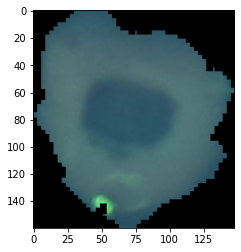

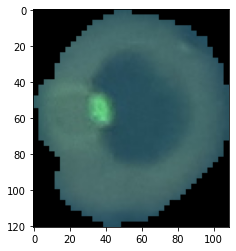

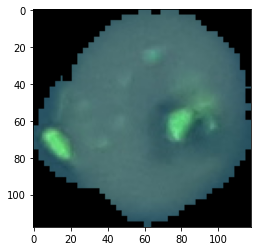

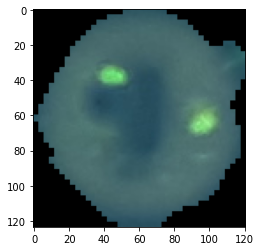

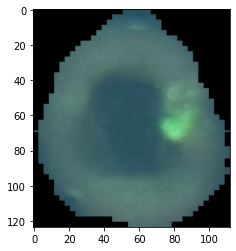

In [ ]:
def load_images(image_folder, dataset = 'Test', class_ = 'Parasite'):

  dataset_path = "/content/Dataset" + "/" + dataset + "/" + class_  

   
  for i in range(5):

    img_path = os.path.join(dataset_path, image_folder[i])  
    img = image.load_img(img_path)
    img_arr = image.img_to_array(img)
    plt.imshow((img_arr*255).astype(np.uint8))
    plt.show()

 
load_images(parasite_images_test)

In [ ]:
train_generator = ImageDataGenerator(rescale= 1.0/255,
                                     rotation_range = 10,
                                     width_shift_range = 1.0,
                                     height_shift_range = 1.0,
                                     shear_range = 0.2,
                                     zoom_range = 0.2,
                                     horizontal_flip = True)

 
training_data = train_generator.flow_from_directory(train_data, target_size=(224,224), class_mode='categorical')

 
test_generator = ImageDataGenerator(rescale=1.0/255)
testing_data = test_generator.flow_from_directory(test_data, target_size=(224,224), class_mode='categorical')

Found 416 images belonging to 2 classes.
Found 134 images belonging to 2 classes.


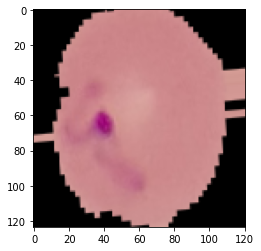

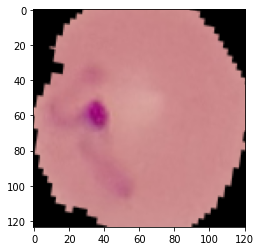

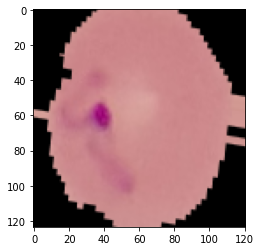

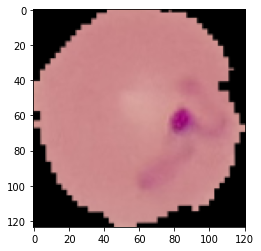

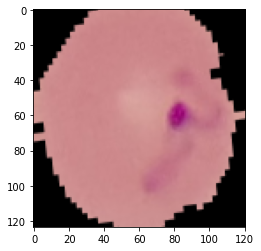

...

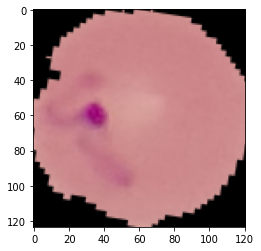

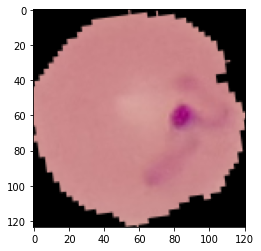

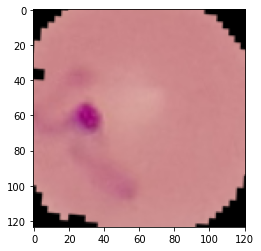

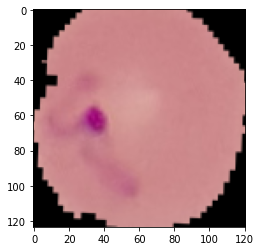

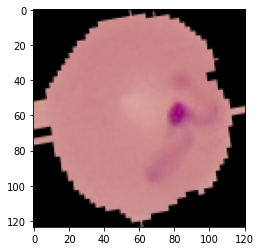

KeyboardInterrupt: ignored

In [ ]:
# Testing the ImageDataGenerator
img1 = image.load_img("/content/Dataset/Train/Parasite/C133P94ThinF_IMG_20151004_155721_cell_111.png")
img1_arr = image.img_to_array(img1)
test = train_generator.flow(img1_arr.reshape((1, *img1_arr.shape)))
for img in test:
  plt.imshow(img[0])
  plt.show()

In [ ]:
from keras.applications import vgg19

 
model = vgg19.VGG19(include_top=False, input_shape=(224, 224, 3))
model.summary()

80142336/80134624 [==============================] - 1s 0us/step
Model: "vgg19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
______________________________________________________________

In [ ]:
model.output

<KerasTensor: shape=(None, 7, 7, 512) dtype=float32 (created by layer 'block5_pool')>

In [ ]:
for i in range(len(model.layers)):
  print(i, model.layers[i])

0 <tensorflow.python.keras.engine.input_layer.InputLayer object at 0x7fb8afb32a10>
1 <tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7fb8b1c942d0>
2 <tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7fb8afb3fa10>
3 <tensorflow.python.keras.layers.pooling.MaxPooling2D object at 0x7fb8b2a36810>
4 <tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7fb8b1683710>
5 <tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7fb8b1680490>
6 <tensorflow.python.keras.layers.pooling.MaxPooling2D object at 0x7fb8b1687310>
7 <tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7fb8b168fe10>
8 <tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7fb8b1696250>
9 <tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7fb8b1680950>
10 <tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7fb8b169cd50>
11 <tensorflow.python.keras.layers.pooling.MaxPooling2D object at 0x7fb8b169c410>
12 <tensorflow.python.ke

In [ ]:
av1 = GlobalAveragePooling2D()(model.output)
fc1 = Dense(256, activation='relu')(av1)
d1 = Dropout(0.5)(fc1)  
fc2 = Dense(2, activation='softmax')(d1)

 
model_new = Model(inputs = model.input, outputs = fc2)

 
model_new.compile(optimizer='adam', loss = 'binary_crossentropy', metrics=['accuracy'])


In [ ]:
 
for i in range(len(model.layers)):

  model.layers[i].trainable = False

model_new.summary()
 
model_new.compile(optimizer='adam', loss = 'categorical_crossentropy', metrics=['accuracy'])
callback = EarlyStopping(patience=10)
 
hist1 = model_new.fit_generator(training_data, steps_per_epoch= 416//32, validation_data=testing_data, epochs = 100, validation_steps=134//32, callbacks=callback)



Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/100
13/13 [==============================] - 44s 437ms/step - loss: 0.8124 - accuracy: 0.5079 - val_loss: 0.6274 - val_accuracy: 0.6641
Epoch 2/100
13/13 [==============================] - 6s 427ms/step - loss: 0.7923 - accuracy: 0.4961 - val_loss: 0.5946 - val_accuracy: 0.6875
Epoch 3/100
13/13 [==============================] - 6s 429ms/step - loss: 0.6879 - accuracy: 0.5754 - val_loss: 0.6368 - val_accuracy: 0.7969
Epoch 4/100
13/13 [==============================] - 6s 432ms/step - loss: 0.6298 - accuracy: 0.6628 - val_loss: 0.5989 - val_accuracy: 0.7031
Epoch 5/100
13/13 [==============================] - 6s 437ms/step - loss: 0.6407 - accuracy: 0.6325 - val_loss: 0.5913 - val_accuracy: 0.7031
Epoch 6/100
13/13 [==============================] - 6s 436ms/step - loss: 0.6042 - accuracy: 0.6884 - val_loss: 0.6299 - val_accuracy: 0.7188
Epoch 7/100
13/13 [==============================] - 6s 428ms/step - loss: 0.5967 - accuracy: 0.6376 - val_loss: 0.6068 - val_accuracy: 0.773

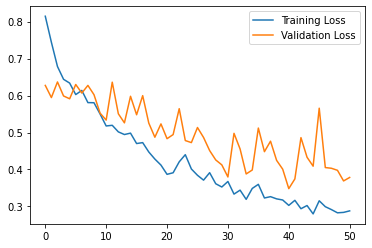

In [ ]:
h = hist1.history
plt.plot(h['loss'], label = 'Training Loss')
plt.plot(h['val_loss'], label = "Validation Loss")
plt.legend()
plt.show()

In [ ]:
print("Accuarcy of our model on the testing set :  %.3f"%(model_new.evaluate_generator(testing_data)[1]))

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1877: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  warnings.warn('`Model.evaluate_generator` is deprecated and '


Accuarcy of our model on the testing set :  0.813


In [ ]:
for i in range(len(model.layers)):

  model.layers[i].trainable = True

model_new.summary()
model_new.compile(optimizer='adam', loss = 'binary_crossentropy', metrics=['accuracy'])
callback = EarlyStopping(patience=10)
hist = model_new.fit_generator(training_data, epochs=100, steps_per_epoch = 416//32, validation_data=testing_data, callbacks=callback)

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/100
13/13 [==============================] - 13s 584ms/step - loss: 208.2103 - accuracy: 0.5446 - val_loss: 0.6956 - val_accuracy: 0.3209
Epoch 2/100
13/13 [==============================] - 8s 572ms/step - loss: 0.8018 - accuracy: 0.5487 - val_loss: 0.6849 - val_accuracy: 0.6791
Epoch 3/100
13/13 [==============================] - 8s 571ms/step - loss: 0.7410 - accuracy: 0.5306 - val_loss: 0.6943 - val_accuracy: 0.3209
Epoch 4/100
13/13 [==============================] - 8s 566ms/step - loss: 0.6958 - accuracy: 0.4609 - val_loss: 0.6940 - val_accuracy: 0.3209
Epoch 5/100
13/13 [==============================] - 7s 557ms/step - loss: 0.6935 - accuracy: 0.4729 - val_loss: 0.6932 - val_accuracy: 0.3209
Epoch 6/100
13/13 [==============================] - 7s 553ms/step - loss: 0.6931 - accuracy: 0.5109 - val_loss: 0.6919 - val_accuracy: 0.6791
Epoch 7/100
13/13 [==============================] - 7s 552ms/step - loss: 0.6930 - accuracy: 0.5372 - val_loss: 0.6910 - val_accuracy: 0.6